In [1]:
! pip install p-decision-tree

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import pandas as pd
import numpy as np
from p_decision_tree.DecisionTree import DecisionTree

loan_data = pd.read_excel("loan.xlsx")
loan_data.head()

,Sex,Age,Time_at_address,Res_status,Telephone,Occupation,Job_status,Time_employed,Time_bank,Liab_ref,Acc_ref,Home_Expn,Balance,Decision
0,M,50.750000,0.585,owner,given,unemploye,unemploye,0,0,f,given,145,0,reject
1,M,19.670000,10.000,rent,not_given,labourer,governmen,0,0,t,given,140,0,reject
2,F,52.830002,15.000,owner,given,creative_,private_s,5,14,f,given,0,2200,accept
3,M,22.670000,2.540,rent,not_given,creative_,governmen,2,0,f,given,0,0,accept
4,M,29.250000,13.000,owner,given,driver,governmen,0,0,f,given,228,0,reject


In [4]:
# removing numerical data
loan_data = loan_data.drop(["Age", "Time_at_address", "Telephone", "Time_employed", "Time_bank", "Home_Expn", "Balance"], axis = 1)
loan_data.head()

,Sex,Res_status,Occupation,Job_status,Liab_ref,Acc_ref,Decision
0,M,owner,unemploye,unemploye,f,given,reject
1,M,rent,labourer,governmen,t,given,reject
2,F,owner,creative_,private_s,f,given,accept
3,M,rent,creative_,governmen,f,given,accept
4,M,owner,driver,governmen,f,given,reject


0.9920484059672627


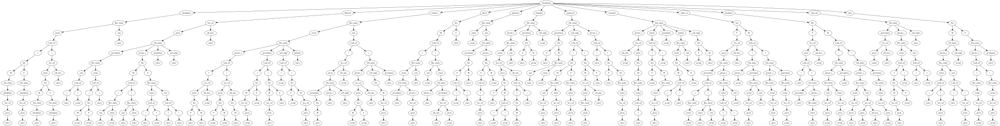

Gini for Occupation is 0.8912144576480241
Gini for Job Status is 0.5687428344771003


In [5]:
from subprocess import call
from IPython.display import Image

remaining_columns = loan_data.columns[:-1]
decision_column = loan_data.columns[-1]

x = loan_data[remaining_columns].values
y = loan_data[decision_column].values

decision_tree = DecisionTree(x.tolist(), remaining_columns.tolist(), y.tolist(), "entropy")
decision_tree.id3(0,0)
print(format(decision_tree.entropy))

dot = decision_tree.print_visualTree( render = True )
display(dot)

def gini_impurity(data_passed):
  if isinstance(data_passed, pd.Series):
    p = data_passed.value_counts()/data_passed.shape[0]
    gini = 1-np.sum(p**2)
    return(gini)

  else:
    raise("Object must be a Pandas Series")

gini = gini_impurity(loan_data.Occupation) 
print("Gini for Occupation is", gini)

gini = gini_impurity(loan_data.Job_status) 
print("Gini for Job Status is", gini)

In [6]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns

%matplotlib inline

loan_data = pd.read_excel("loan.xlsx")
loan_data.head()

,Sex,Age,Time_at_address,Res_status,Telephone,Occupation,Job_status,Time_employed,Time_bank,Liab_ref,Acc_ref,Home_Expn,Balance,Decision
0,M,50.750000,0.585,owner,given,unemploye,unemploye,0,0,f,given,145,0,reject
1,M,19.670000,10.000,rent,not_given,labourer,governmen,0,0,t,given,140,0,reject
2,F,52.830002,15.000,owner,given,creative_,private_s,5,14,f,given,0,2200,accept
3,M,22.670000,2.540,rent,not_given,creative_,governmen,2,0,f,given,0,0,accept
4,M,29.250000,13.000,owner,given,driver,governmen,0,0,f,given,228,0,reject


In [7]:
loan_data = loan_data.drop(["Age", "Time_at_address", "Telephone", "Time_employed", "Time_bank", "Home_Expn", "Balance"], axis = 1)
loan_data.head()

,Sex,Res_status,Occupation,Job_status,Liab_ref,Acc_ref,Decision
0,M,owner,unemploye,unemploye,f,given,reject
1,M,rent,labourer,governmen,t,given,reject
2,F,owner,creative_,private_s,f,given,accept
3,M,rent,creative_,governmen,f,given,accept
4,M,owner,driver,governmen,f,given,reject


In [8]:
! pip install category-encoders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 KB 9.0 MB/s eta 0:00:00


In [9]:
import category_encoders as encoder

x = loan_data[["Sex", "Res_status", "Occupation", "Job_status", "Liab_ref", "Acc_ref"]]
y = loan_data[["Decision"]]

new_code = encoder.OrdinalEncoder(cols=["Sex", "Res_status", "Occupation", "Job_status", "Liab_ref", "Acc_ref"])
x = new_code.fit_transform(x)
x.head()

,Sex,Res_status,Occupation,Job_status,Liab_ref,Acc_ref
0,1,1,1,1,1,1
1,1,2,2,2,2,1
2,2,1,3,3,1,1
3,1,2,3,2,1,1
4,1,1,4,2,1,1


In [10]:
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
from subprocess import call
from IPython.display import Image

random_forest_model = RandomForestClassifier(n_estimators=100, random_state=0)
random_forest_model.fit(x, y)
random_forest_estimator = random_forest_model.estimators_[7]

columns = loan_data.columns

descriptive_features = columns[:-1]
label = columns[-1]

export_graphviz(random_forest_estimator, out_file='random_forest.dot', feature_names = descriptive_features, class_names = label, rounded = True, proportion = False, precision = 2, filled = True)

call(['dot', '-Tpng', 'random_forest.dot', '-o', 'random_forest.png', '-Gdpi=600'])
Image(filename = 'random_forest.png')

<ipython-input-10-37cfa9b2c43f>:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  random_forest_model.fit(x, y)
